In [1]:
from navground import sim,core
import h5py
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance_matrix
import matplotlib.colors as colors
import matplotlib.cm as cmx
from navground.sim.ui.video import display_video, display_video_from_run
from navground.sim import Agent, Wall

# import created library for experiments.
import importlib.util
from pathlib import Path
ruta_archivo = Path("functions.py")
spec = importlib.util.spec_from_file_location("functions", ruta_archivo)
fu = importlib.util.module_from_spec(spec)
spec.loader.exec_module(fu)

In [2]:
yaml = """
steps: 5000
time_step: 0.1
runs: 1
terminated_when_idle_or_stuck: false
record_pose: true
record_twist: true
record_collisions: true
record_deadlocks: true
record_efficacy: true
run_index: 0
scenario:
    type: Cross
    agent_margin: 0.1
    side: 10
    target_margin: 0.1
    tolerance: 0.5
    groups:
      -
        type: wheelchair
        number: 10
        radius: 0.4
        color: "green"
        kinematics:
          type: 2WDiff
          wheel_axis: 0.094
          max_speed: 0.166
        behavior:
          type: HL
          optimal_speed: 0.12
          horizon: 5.0
          safety_margin: 0.02
          barrier_angle: 1.4
        state_estimation:
          type: Bounded
          range: 5.0
      -
        type: human
        number: 10
        radius: 0.2
        color: "yellow"
        kinematics:
          type: Ahead
          max_speed: 0.3
          max_angular_speed: 1.0
        behavior:
          type: HL
          optimal_speed: 0.15
          horizon: 5.0
          safety_margin: 0.1
          barrier_angle: 1.4
        state_estimation:
          type: Bounded
          range: 5.0
      -
        type: agent
        number: 10
        radius: 0.1
        color: "pink"
        kinematics:
          type: Omni
          max_speed: 0.2
          max_angular_speed: 1.0
        behavior:
          type: ORCA
        state_estimation:
          type: Bounded
          range: 4.0
"""

experimentHL = sim.load_experiment(yaml)
experimentHL.run(number_of_threads = 12) # with 0 threads 10 seconds 10 simulations, with 12 threads 1 second 10 simulations,
print(experimentHL.duration)

0:00:01.529083


We are going to create an environment where 3 types of agents interact:
- Agents with kinematics ‘ahead’, they are agents without wheels that move towards where they move (people for example). If we want it to be represented as a person in the videos: type human **Yellow**.
- Agents with ‘omni’ kinematics are those with unconstrained kinematics, i.e., it refers to the study of the motion of an object without considering the forces that cause that motion, focusing only on how the object's position, velocity, and acceleration change over time. In this context, ‘unconstrained’ means that the motion is not constrained by surfaces or objects; that is, the object can move freely in any direction in three-dimensional space. For example, a quadcopter is a type of unmanned aircraft (drone) that has four propellers, usually arranged in the shape of a cross. **Pink**
- Agents with ‘2WDiff’ kinematics correspond to a robot with two differential drive wheels, one on each side of a longitudinal axis, like wheelchairs. If we want it to be represented as a person in videos: type wheelchair **Green** Another possible type is thymio: The Thymio robot, a small robot with a size of 8 cm and a two-wheel differential drive kinematics, which is a very common kinematics4 shared by many floor robots and most intelligent wheelchairs.

In [5]:
i = 0
def decorate(agent):
    if agent.has_been_in_collision_since(run.world.time - 1.0):
        return {'fill': 'lightred'}
    if agent.has_been_stuck_since(run.world.time - 1.0):
        return {'fill': 'lightblue'}
    return {}



run = experimentHL.runs[i]
display_video_from_run(run, factor=10.0, 
             decorate=decorate, width=600) # if the simulation is too long in timeit doesn't work, we must reduce number of time_instances or increase the factor variable to make a shorter video

We access the run of the experiment and get the coordinates stored in the pose, as well as the orientation. Also, we need to get an idea of the maximum filtering(maximum epsilon in simplicial complex construction) value to use, which we will approximate with the largest pairwise distance between robots during the simulation in each time. Also, we keep the type of each agent for visualize later with his correct color:

- Green, wheelchair or thymio agents
- Yellow, human agents
- Pink, other type of agent

In [3]:
i=0
run = experimentHL.runs[i]
ps = run.poses
print(ps.shape) #has the shape of (instances of time, robots, variables coordinate + angle orientation)
maxd = [float(np.max(distance_matrix(X,X))) for X in ps[:,:,:2]]
print(len(maxd))
typeAgents = [agent.type for agent in run.world.agents]

(5000, 30, 3)
5000


See if a simulation has been safe and smooth (fluida):

$safe = 
\begin{cases} 
     1 & \text{if number of collisions } = 0 \\
     0 & \text{if number of collisions } > 0 
\end{cases}$

$smooth = 
\begin{cases} 
     1 & \text{if number of deadlocks } = 0 \\
     0 & \text{if number of deadlocks } > 0 
\end{cases}$

**Elements of run.collisions come in the form (time step, id_robot1, id_robot2), representing each element an specific collision, so the lenght of this array is the number of collisions in the simulation**

**Elements of run.deadlocks tell the time since agents are deadlocked, so the length of this array is the number of robots. If all  robots have negatuve number(-1) there are no deadlocks.**

In [4]:
safe = 1 if len(run.collisions) == 0 else 0
if safe == 1:
    print("This simulation is completely safe because there are no collisions.")
else:
    print("Collisions occurs in this simulation, so it's not safety")
def count_deadlocks(deadlock_time, final_time):
    is_deadlocked = np.logical_and(deadlock_time > 0, deadlock_time < (final_time - 5.0))
    return sum(is_deadlocked)
    
smooth = 1 if count_deadlocks(run.deadlocks,run.maximal_steps*run.time_step) == 0 else 0
if smooth == 1:
    print("This simulation is completely smooth because there are no deadlocks.")
else:
    print("Deadlocks occurs in this simulation, so it's not smooth")

Collisions occurs in this simulation, so it's not safety
This simulation is completely smooth because there are no deadlocks.


With this we can now start to perform topological data analysis and calculate the persistent entropy.

Let's see an example of the point cloud of the robots in the first instant of time and its persistent entropy.

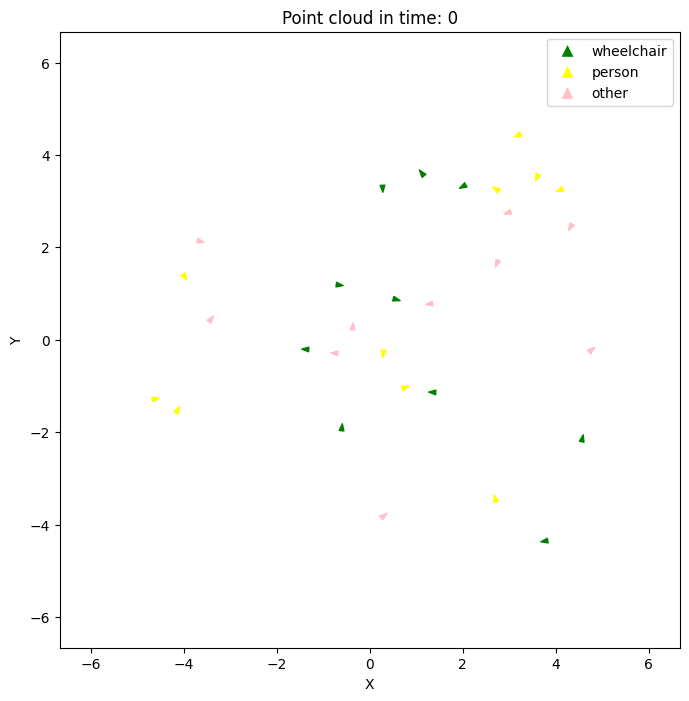

<Figure size 800x800 with 0 Axes>

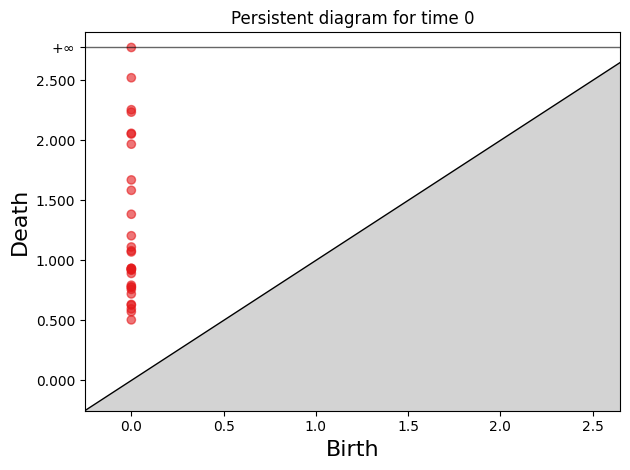

Persistent entropy at time 0: 3.059


In [5]:
time=0
plt.figure(figsize=(8, 8))
fu.plotPointCloudMoment(ps,time,length=10,width=10,types=typeAgents)
# plt.savefig(f'Images/CorridorPointCloudExample{behavior}.png', dpi=300, bbox_inches='tight')
plt.show()
plt.figure(figsize=(8, 8))
fu.plotPersistenceDiagram(ps,time,0)
plt.tight_layout()
# plt.savefig(f'Images/CorridorPersistentBarcodeExample{behavior}.png', dpi=300, bbox_inches='tight')
plt.show()
persistence = fu.ComputePersistenceDiagram(ps,time,0,"rips")
persistenceL = fu.limitingDiagram(persistence,maxd[time])
print(f"Persistent entropy at time {time}: {fu.EntropyCalculationFromBarcode(persistenceL)}")